# OpenCV

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import cv2

## Spatial Domain

In [3]:
img = cv2.imread('mountain.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img_gray = cv2.imread('mountain.jpg', 0)

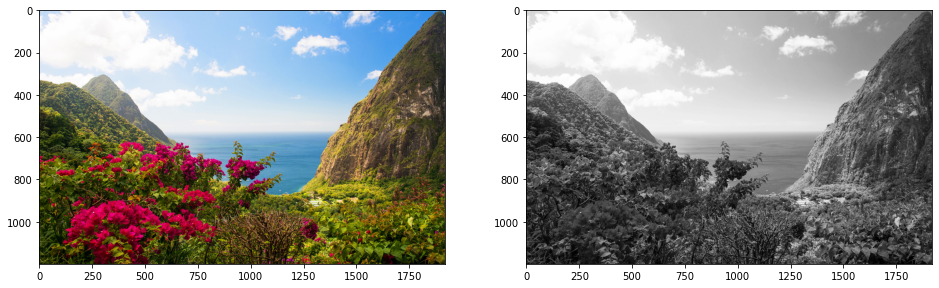

In [4]:
# using matplotlib to show image
fig, (ax1, ax2) = plt.subplots(nrows= 1, ncols = 2, figsize= (16,6))
ax1.imshow(img)
ax2.imshow(img_gray, cmap='gray');

In [5]:
print('Color/actual image shape = ', img.shape)
print('\nGray scale image shape = ', img_gray.shape)

Color/actual image shape =  (1200, 1920, 3)

Gray scale image shape =  (1200, 1920)


In [6]:
# to display image using opencv
while True:
    cv2.imshow('color image', img)
    cv2.imshow('gray image', img_gray)
    if cv2.waitKey(20) & 0xFF == 27:
        break
        
cv2.destroyAllWindows()

## Resize the image 

In [7]:
imgr = cv2.imread('mountain.jpg')
imgr = cv2.cvtColor(imgr, cv2.COLOR_BGR2RGB)

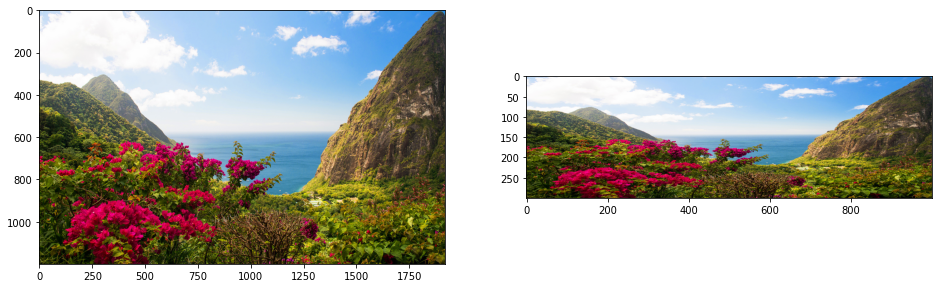

In [8]:
img_resize = cv2.resize(imgr, (1000,300))

fig, (ax1, ax2) = plt.subplots(nrows= 1, ncols = 2, figsize= (16,6))
ax1.imshow(img)
ax2.imshow(img_resize);

## Splitting the image

In [9]:
# different channels
red , green , blue = cv2.split(img)

		 Red channel 				 Green channel 				 Blue channel


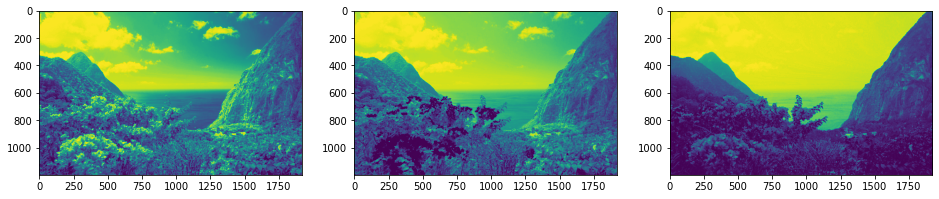

In [10]:
print('\t\t Red channel \t\t\t\t Green channel \t\t\t\t Blue channel')
fig, (ax1, ax2, ax3) = plt.subplots(nrows= 1, ncols = 3, figsize= (16,6))
ax1.imshow(red)
ax2.imshow(green)
ax3.imshow(blue);

In [11]:
print('Image shape (only red channel): ', red.shape)
print('Image shape (only green channel): ', green.shape)
print('Image shape (only blue channel): ', blue.shape)

Image shape (only red channel):  (1200, 1920)
Image shape (only green channel):  (1200, 1920)
Image shape (only blue channel):  (1200, 1920)


## Merge Images - (of same size)

### Method-1

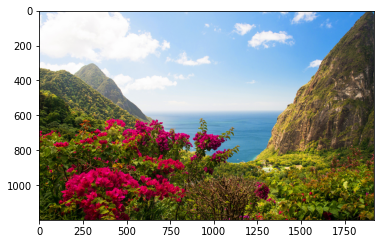

In [12]:
img_merge = cv2.merge((red ,green ,blue))
plt.imshow(img_merge);

### Method-2

In [13]:
img1 = cv2.imread('mountain.jpg')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

img2 = cv2.imread('road.jpg')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

In [14]:
print('image-1 shape = ', img1.shape)
print('\nimage-2 shape = ', img2.shape)

image-1 shape =  (1200, 1920, 3)

image-2 shape =  (1080, 1920, 3)


In [15]:
# resizing both images, to be equal 
img1 = cv2.resize(img1, (1200,1000))
img2 = cv2.resize(img2, (1200,1000))

In [16]:
merge = cv2.addWeighted(src1 = img1, alpha=0.5, src2 = img2, beta=0.5, gamma=0)

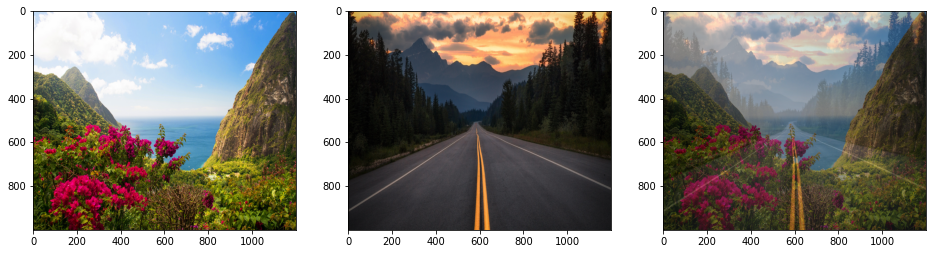

In [17]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows= 1, ncols = 3, figsize= (16,6))
ax1.imshow(img1)
ax2.imshow(img2)
ax3.imshow(merge);

## Edge detection

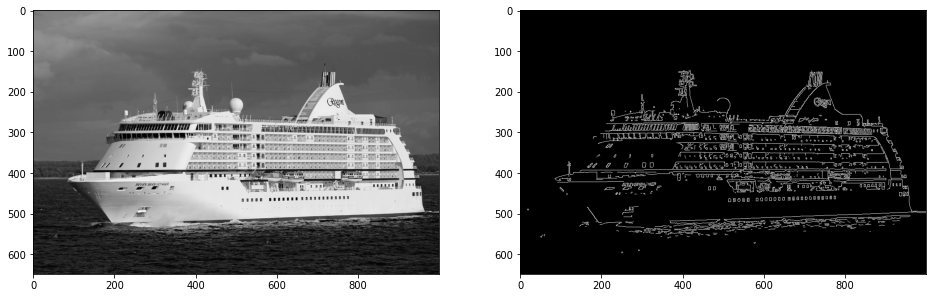

In [18]:
img = cv2.imread('ship.jpeg',0)

img_edge = cv2.Canny(image=img, threshold1=255, threshold2=400)

fig, (ax1, ax2) = plt.subplots(nrows= 1, ncols = 2, figsize= (16,6))
ax1.imshow(img, cmap='gray')
ax2.imshow(img_edge, cmap='gray');

## Image Thresholding (Binarization)

### Method-1

In [19]:
# reading image as gray-scale
img = cv2.imread('mountain.jpg', 0)
img.max()

255

In [20]:
# any value below 127 will be shifted down to zero and any value above 127 will shifted to max value
value, th_image = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

In [21]:
# to inverse
value, th_image_inv = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)

In [22]:
hist_gray = cv2.calcHist([img],channels=[0],mask=None,histSize=[256],ranges=[0,256])
hist_th = cv2.calcHist([th_image],channels=[0],mask=None,histSize=[256],ranges=[0,256])
hist_th_inv = cv2.calcHist([th_image_inv],channels=[0],mask=None,histSize=[256],ranges=[0,256])

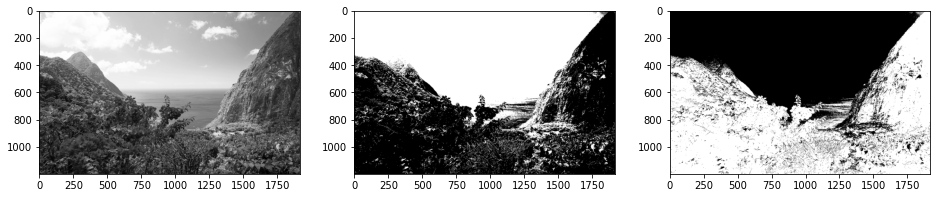

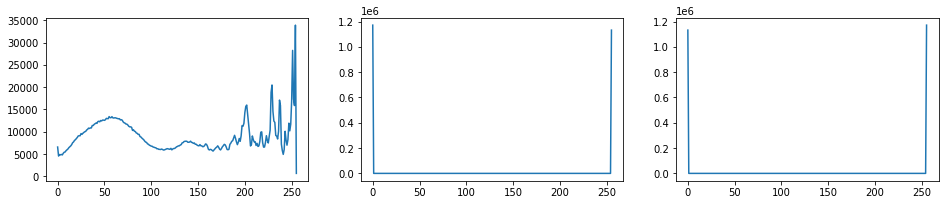

In [23]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows= 1, ncols = 3, figsize= (16,3))
ax1.imshow(img, cmap='gray')
ax2.imshow(th_image, cmap='gray')
ax3.imshow(th_image_inv, cmap='gray')

fig, (ax4, ax5, ax6) = plt.subplots(nrows= 1, ncols = 3, figsize= (16,3))
ax4.plot(hist_gray)
ax5.plot(hist_th)
ax6.plot(hist_th_inv);

### Method-2

In [24]:
# reading image as gray-scale
img = cv2.imread('mountain.jpg', 0)

In [25]:
# adaptive threshold
th2_image = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 17, 8)

In [26]:
# inverse of above
th2_image_inv = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 17, 8)

In [27]:
hist_gray_2 = cv2.calcHist([img],channels=[0],mask=None,histSize=[256],ranges=[0,256])
hist_th2 = cv2.calcHist([th2_image],channels=[0],mask=None,histSize=[256],ranges=[0,256])
hist_th2_inv = cv2.calcHist([th2_image_inv],channels=[0],mask=None,histSize=[256],ranges=[0,256])

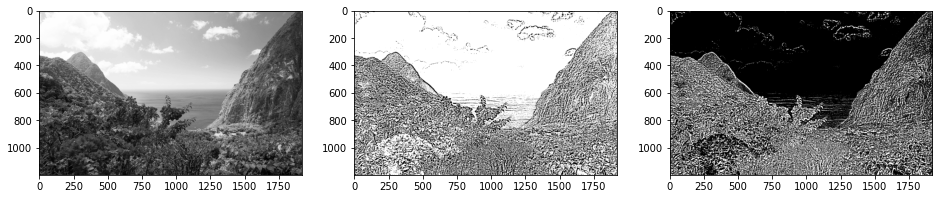

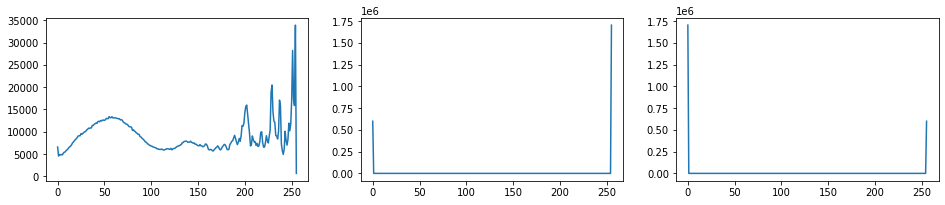

In [28]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows= 1, ncols = 3, figsize= (16,6))
ax1.imshow(img, cmap='gray')
ax2.imshow(th2_image, cmap='gray')
ax3.imshow(th2_image_inv, cmap='gray')

fig, (ax4, ax5, ax6) = plt.subplots(nrows= 1, ncols = 3, figsize= (16,3))
ax4.plot(hist_gray_2)
ax5.plot(hist_th2)
ax6.plot(hist_th2_inv);

### Comparison: Method-1 & Method-2

		 Binary Threshold Inverse 					 Adaptive Binary Threshold inverse


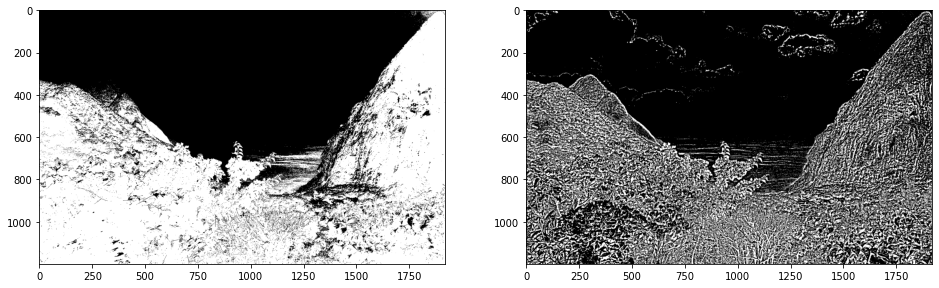

In [29]:
print('\t\t Binary Threshold Inverse \t\t\t\t\t Adaptive Binary Threshold inverse')
fig, (ax1, ax2) = plt.subplots(nrows= 1, ncols = 2, figsize= (16,5))
ax1.imshow(th_image_inv, cmap='gray')
ax2.imshow(th2_image_inv, cmap='gray');

##  Histrogram

In [30]:
img = cv2.imread('mountain.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

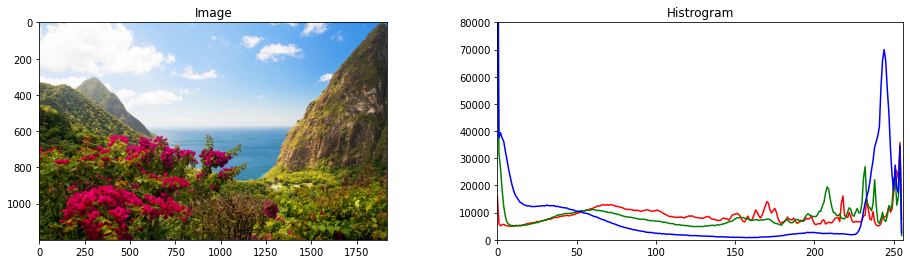

In [31]:
# 3 color channel
import sys
plt.figure(figsize=(16,4))
img = img
color = ('r','g','b')
for i,col in enumerate(color):
    histr = cv2.calcHist([img],[i],None,[256],[0,256])
    plt.subplot(1, 2, 2)
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.ylim([0,80000])
plt.title('Histrogram');

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Image');

## Histrogram equalization (Contrast Stretching or Image enhancement)

### 1. Gray scale image

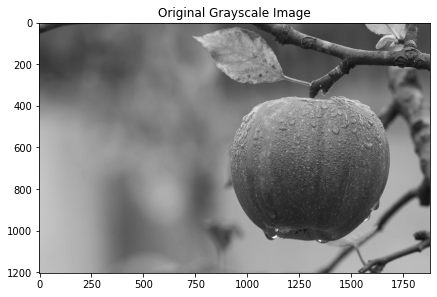

In [32]:
img = cv2.imread('fruit.jpeg',0)

plt.figure(figsize=(7,7))
plt.title('Original Grayscale Image')
plt.imshow(img, cmap='gray');

In [33]:
# original image hist
img_hist = cv2.calcHist([img],channels=[0],mask=None,histSize=[256],ranges=[0,256])

# equalizing the original image
eq_img = cv2.equalizeHist(img)

# hist of equalize image
eq_img_hist = cv2.calcHist([eq_img],channels=[0],mask=None,histSize=[256],ranges=[0,256])

# negative of equalized image
eq_img_negative = 255 - eq_img

# hist of equalize negative image
eq_img_negative_hist = cv2.calcHist([eq_img_negative],channels=[0],mask=None,histSize=[256],ranges=[0,256])

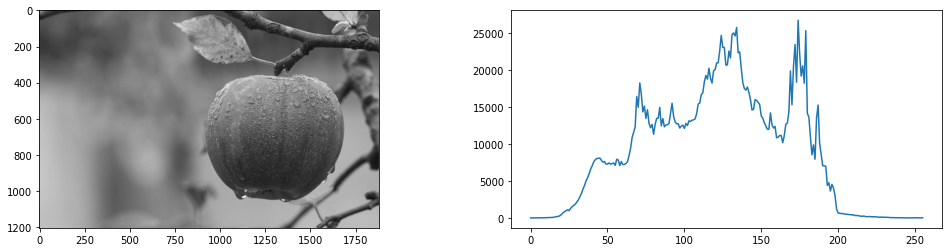

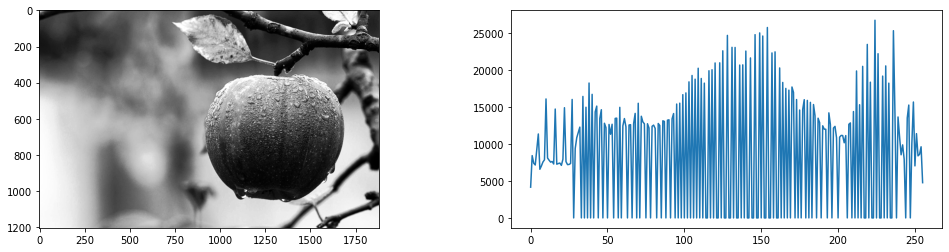

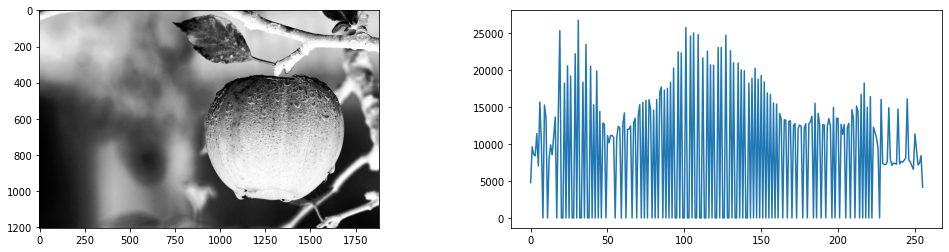

In [34]:
fig, (ax1, ax2) = plt.subplots(nrows= 1, ncols = 2, figsize= (17,4))
ax1.imshow(img, cmap='gray')
ax2.plot(img_hist)

fig, (ax3, ax4) = plt.subplots(nrows= 1, ncols = 2, figsize= (17,4))
ax3.imshow(eq_img, cmap='gray')
ax4.plot(eq_img_hist)

fig, (ax5, ax6) = plt.subplots(nrows= 1, ncols = 2, figsize= (17,4))
ax5.imshow(eq_img_negative, cmap='gray')
ax6.plot(eq_img_negative_hist);

### 2. Color image

In [35]:
img = cv2.imread('road.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [36]:
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

In [37]:
# value channel(intensity)
hsv[:,:,2] = cv2.equalizeHist(hsv[:,:,2])

In [38]:
img_eq = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

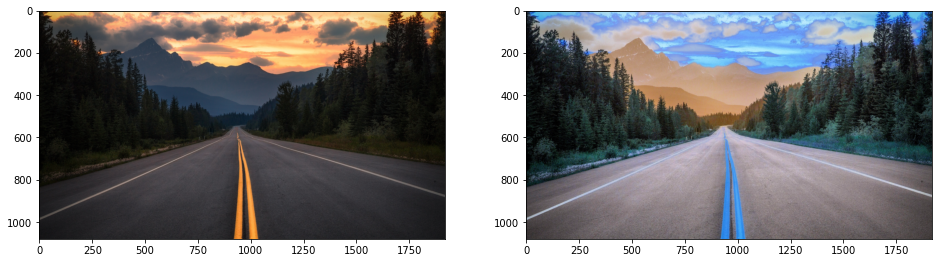

In [39]:
fig, (ax1, ax2) = plt.subplots(nrows= 1, ncols = 2, figsize= (16,6))
ax1.imshow(img)
ax2.imshow(img_eq);

## Negative transformation

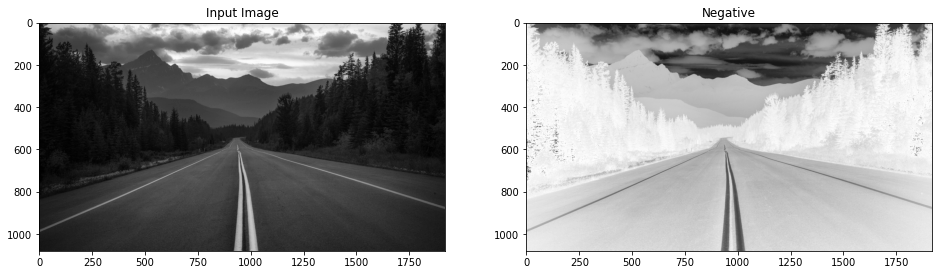

In [40]:
img = cv2.imread('road.jpg',0)
 
img_neg = 1-img
 
plt.figure(figsize=(16,10))

plt.subplot(1, 2, 1)
plt.imshow(img, cmap = 'gray')
plt.title('Input Image')

plt.subplot(1, 2, 2)
plt.imshow(img_neg, cmap = 'gray')
plt.title('Negative');

## Log transformation

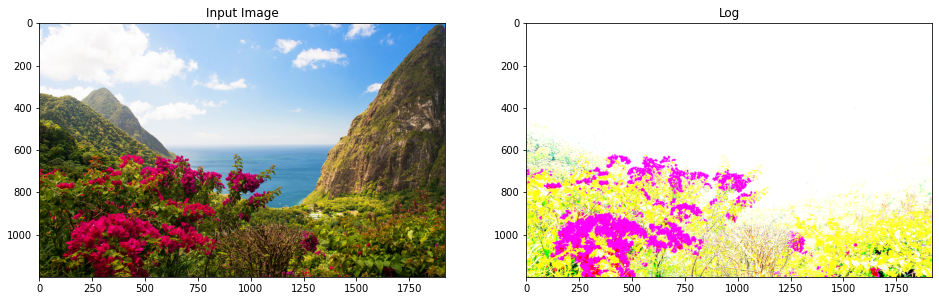

In [41]:
img = cv2.imread('mountain.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img_log = np.uint8(np.log1p(img))
img_log = cv2.threshold(img_log,1,255,cv2.THRESH_BINARY)[1]

plt.figure(figsize=(16,10))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Input Image')

plt.subplot(1, 2, 2)
plt.imshow(img_log)
plt.title('Log');

## Power Law (Gamma) Transformations 

							c=1 and gamma=2


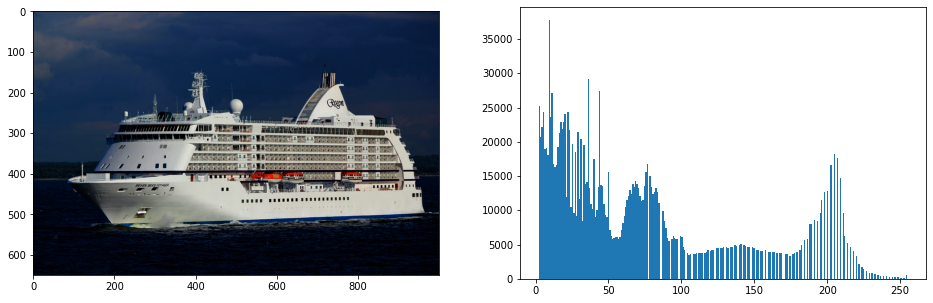

In [42]:
img = plt.imread('ship.jpeg')

c = 1.0
gamma = 2.0
img_gamma_1 = (255*c*(img / 255)**gamma).astype('uint8')


#---------------------------------------------------------------#

print('\t\t\t\t\t\t\tc=1 and gamma=2')
fig, (ax1, ax2) = plt.subplots(nrows= 1, ncols = 2, figsize= (16,5))
ax1.imshow(img_gamma_1)
ax2.hist(img_gamma_1.flatten(), 256, range=(2, 255)); # color='k' 

							c=1 and gamma=0.5


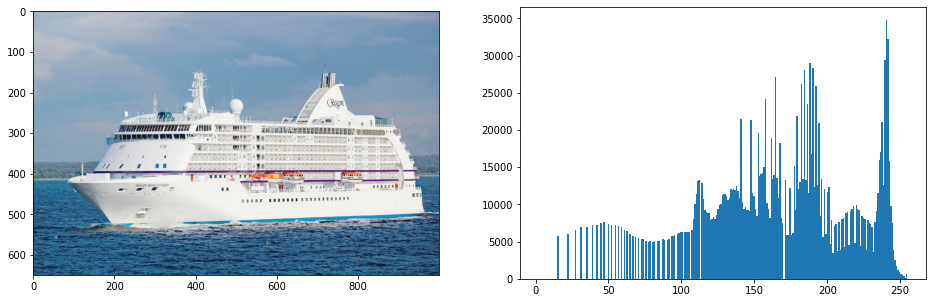

In [43]:
img = plt.imread('ship.jpeg')

c = 1.0
gamma = 0.5
img_gamma_2 = (255*c*(img / 255)**gamma).astype('uint8')

#---------------------------------------------------------------#

print('\t\t\t\t\t\t\tc=1 and gamma=0.5')
fig, (ax1, ax2) = plt.subplots(nrows= 1, ncols = 2, figsize= (16,5))
ax1.imshow(img_gamma_2)
ax2.hist(img_gamma_2.flatten(), 256, range=(2, 255));

### Comparison

		 Original Image 			 c=1 and gamma=2 			 c=1 and gamma=0.5


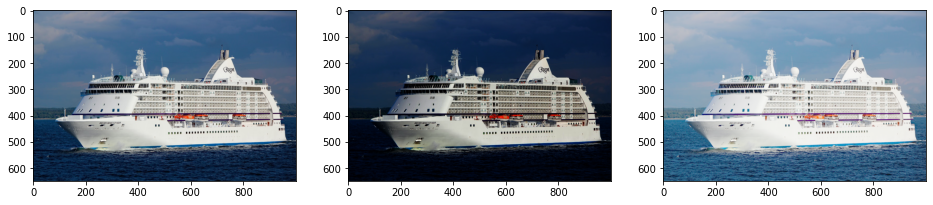

In [44]:
print('\t\t Original Image \t\t\t c=1 and gamma=2 \t\t\t c=1 and gamma=0.5')
fig, (ax1, ax2, ax3) = plt.subplots(nrows= 1, ncols = 3, figsize= (16,6))
ax1.imshow(img)
ax2.imshow(img_gamma_1)
ax3.imshow(img_gamma_2);

## Bit Plane Slicing

In [45]:
img = cv2.imread('mountain.jpg', 0)

In [46]:
plane7 = img & 128*np.ones(img.shape).astype('uint8')
plane6 = img &  64*np.ones(img.shape).astype('uint8')
plane5 = img &  32*np.ones(img.shape).astype('uint8')
plane4 = img &  16*np.ones(img.shape).astype('uint8')
plane3 = img &   8*np.ones(img.shape).astype('uint8')
plane2 = img &   4*np.ones(img.shape).astype('uint8')
plane1 = img &   2*np.ones(img.shape).astype('uint8')
plane0 = img &   1*np.ones(img.shape).astype('uint8')

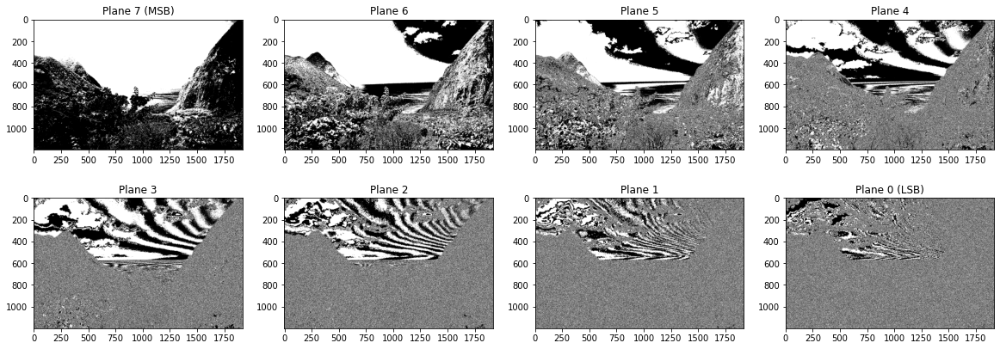

In [47]:
plt.figure(figsize=(20,7))
plt.subplot(2, 4, 1)
plt.imshow(plane7, cmap='gray')
plt.title('Plane 7 (MSB)')
plt.subplot(2, 4, 2)
plt.imshow(plane6, cmap='gray')
plt.title('Plane 6')
plt.subplot(2, 4, 3)
plt.imshow(plane5, cmap='gray')
plt.title('Plane 5')
plt.subplot(2, 4, 4)
plt.imshow(plane4, cmap='gray')
plt.title('Plane 4')
plt.subplot(2, 4, 5)
plt.imshow(plane3, cmap='gray')
plt.title('Plane 3')
plt.subplot(2, 4, 6)
plt.imshow(plane2, cmap='gray')
plt.title('Plane 2')
plt.subplot(2, 4, 7)
plt.imshow(plane1, cmap='gray')
plt.title('Plane 1')
plt.subplot(2, 4, 8)
plt.imshow(plane0, cmap='gray')
plt.title('Plane 0 (LSB)');

## Spatial Filtering

### Smoothig spatial filters

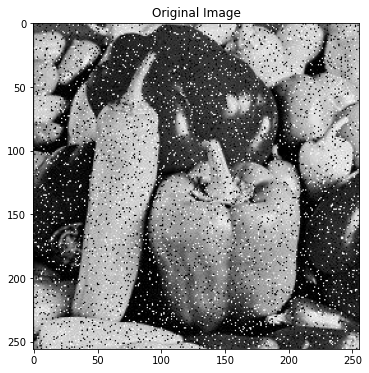

In [48]:
noise_img = cv2.imread('saltandpepper.png')
noise_img = cv2.cvtColor(noise_img, cv2.COLOR_BGR2RGB)

noise_img_1 = noise_img.copy()
noise_img_2 = noise_img.copy()
noise_img_3 = noise_img.copy()

plt.figure(figsize=(16,6))
plt.title('Original Image')
plt.imshow(noise_img);

In [49]:
print('Image Shape = ', noise_img.shape)

Image Shape =  (256, 256, 3)


In [50]:
kernel = np.ones(shape=(5,5), dtype=np.float32)/25
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

In [51]:
# to convolve a kernel with an image
filter_img = cv2.filter2D(noise_img, -1, kernel)

# This is done by convolving an image with a normalized box filter. 
# It simply takes the average of all the pixels under the kernel area and replaces the central element.
average_img = cv2.blur(noise_img_1, (5,5))


# it takes the median of all the pixels under the kernel area and the central element is replaced with this median value
median = cv2.medianBlur(noise_img_2, 9)

# it is highly effective in noise removal while keeping edges sharp
blur = cv2.bilateralFilter(noise_img_3, 9, 75, 75)

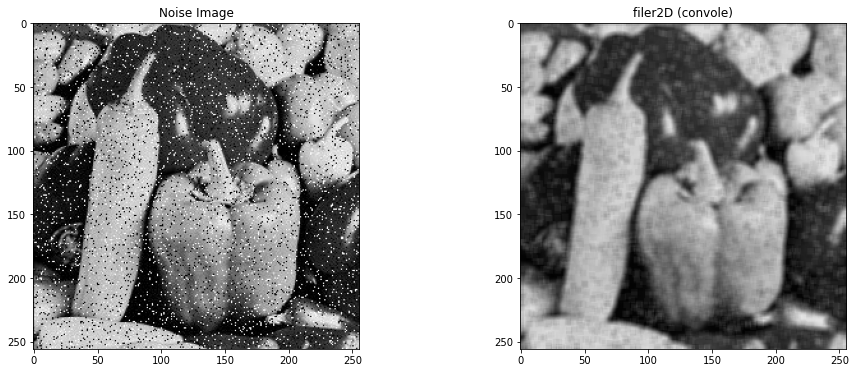

In [52]:
plt.figure(figsize=(16,6))

plt.subplot(1, 2, 1)
plt.imshow(noise_img)
plt.title('Noise Image');

plt.subplot(1, 2, 2)
plt.imshow(filter_img)
plt.title('filer2D (convole)');

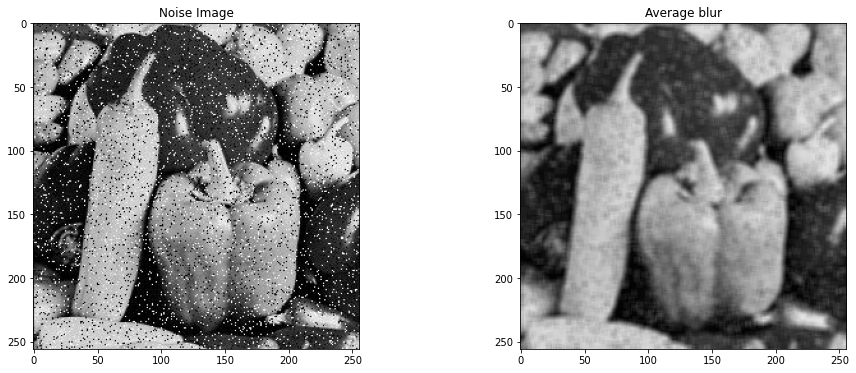

In [53]:
plt.figure(figsize=(16,6))

plt.subplot(1, 2, 1)
plt.imshow(noise_img)
plt.title('Noise Image');

plt.subplot(1, 2, 2)
plt.imshow(average_img)
plt.title('Average blur');

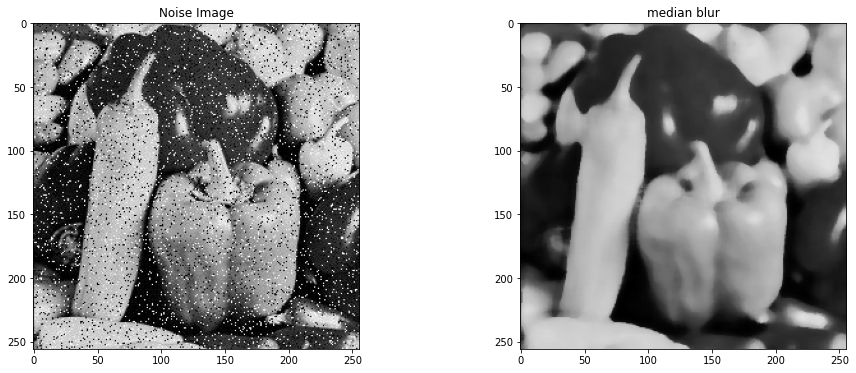

In [54]:
plt.figure(figsize=(16,6))

plt.subplot(1, 2, 1)
plt.imshow(noise_img)
plt.title('Noise Image');

plt.subplot(1, 2, 2)
plt.imshow(median)
plt.title('median blur');

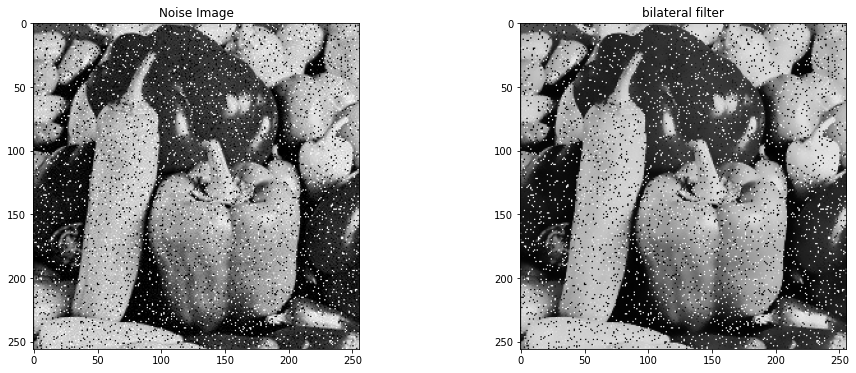

In [55]:
plt.figure(figsize=(16,6))

plt.subplot(1, 2, 1)
plt.imshow(noise_img)
plt.title('Noise Image');

plt.subplot(1, 2, 2)
plt.imshow(blur)
plt.title('bilateral filter');

### Comparison

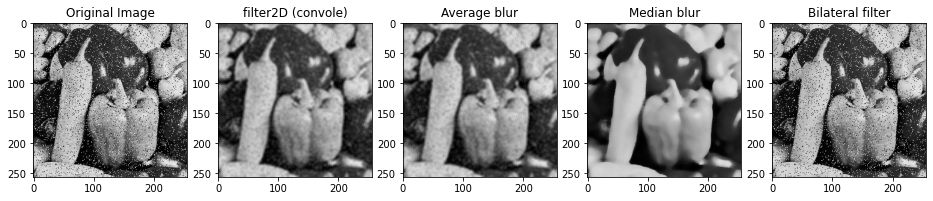

In [56]:
plt.figure(figsize=(16,6))

plt.subplot(1, 5, 1)
plt.imshow(noise_img)
plt.title('Original Image')

plt.subplot(1, 5, 2)
plt.imshow(filter_img)
plt.title('filter2D (convole)')

plt.subplot(1, 5, 3)
plt.imshow(average_img)
plt.title('Average blur')

plt.subplot(1, 5, 4)
plt.imshow(median)
plt.title('Median blur')

plt.subplot(1, 5, 5)
plt.imshow(blur)
plt.title('Bilateral filter');

### Sharpening spatial filters

In [57]:
img = cv2.imread('sudoku.jpg',0)
print('Image Shape = ', img.shape)

Image Shape =  (1024, 962)


In [58]:
# x gradient
sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)

# y gradient
sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)

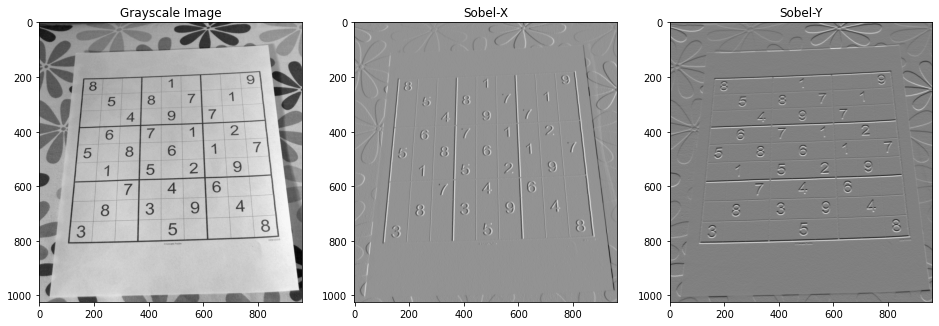

In [59]:
plt.figure(figsize=(16,10))

plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Grayscale Image')

plt.subplot(1, 3, 2)
plt.imshow(sobelx, cmap='gray')
plt.title('Sobel-X')

plt.subplot(1, 3, 3)
plt.imshow(sobely, cmap='gray')
plt.title('Sobel-Y');

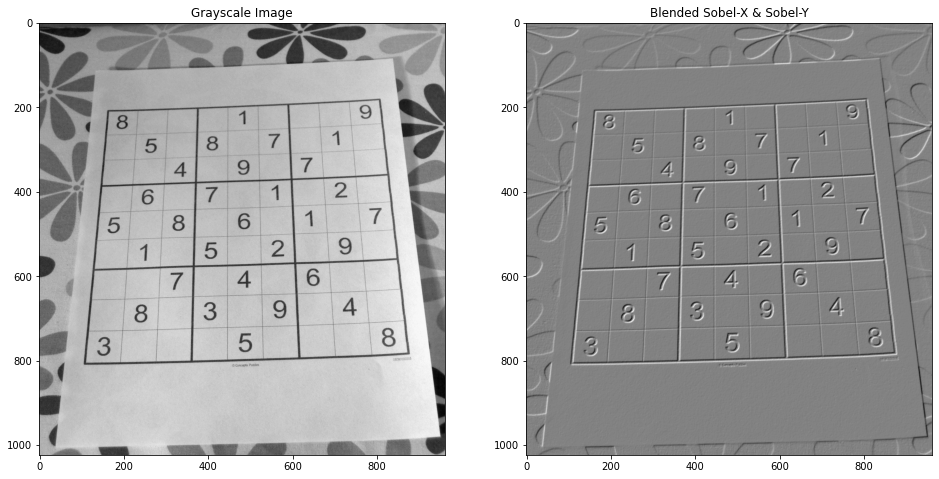

In [60]:
# merging sobelx and sobely
blended_xy = cv2.addWeighted(src1=sobelx,alpha=0.5,src2=sobely,beta=0.5,gamma=0)

plt.figure(figsize=(16,10))

plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Grayscale Image')

plt.subplot(1, 2, 2)
plt.imshow(blended_xy, cmap='gray')
plt.title('Blended Sobel-X & Sobel-Y');

In [61]:
# Laplacian filter
laplacian = cv2.Laplacian(img, cv2.CV_64F)

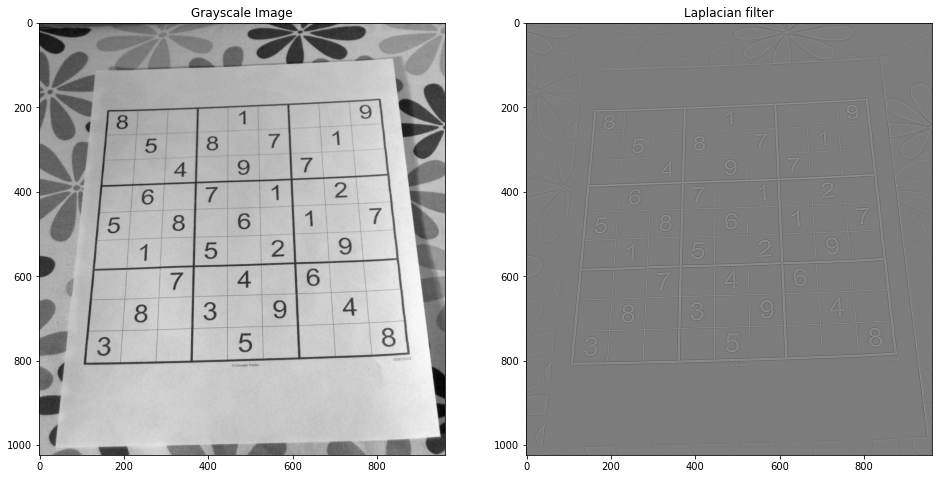

In [62]:
plt.figure(figsize=(16,10))

plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Grayscale Image')

plt.subplot(1, 2, 2)
plt.imshow(laplacian, cmap='gray')
plt.title('Laplacian filter');

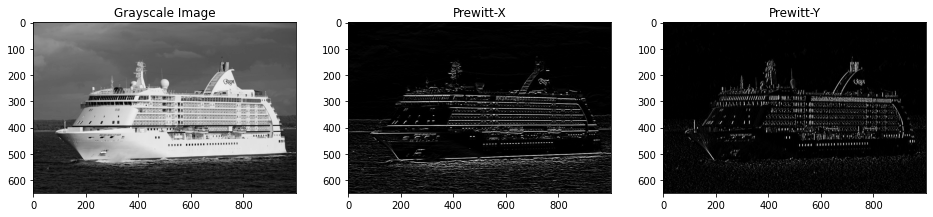

In [63]:
# prewitt operator
img = cv2.imread('ship.jpeg',0)

kernel_x = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
kernel_y = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])

prewitt_x = cv2.filter2D(img, -1, kernel_x)
prewitt_y = cv2.filter2D(img, -1, kernel_y)

plt.figure(figsize=(16,10))

plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Grayscale Image')

plt.subplot(1, 3, 2)
plt.imshow(prewitt_x, cmap='gray')
plt.title('Prewitt-X')

plt.subplot(1, 3, 3)
plt.imshow(prewitt_y, cmap='gray')
plt.title('Prewitt-Y');

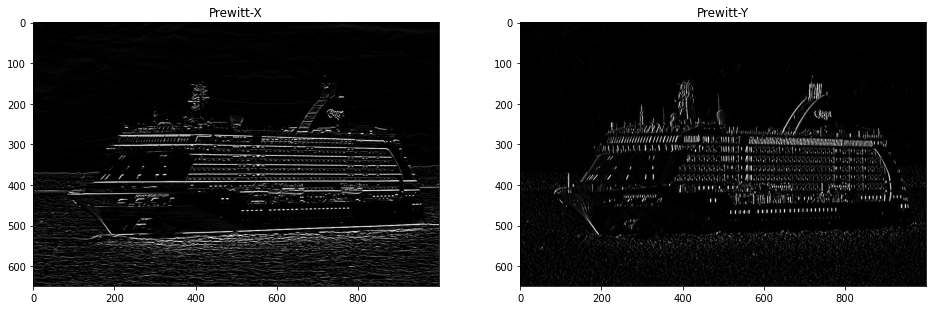

In [64]:
plt.figure(figsize=(16,10))

plt.subplot(1, 2, 1)
plt.imshow(prewitt_x, cmap='gray')
plt.title('Prewitt-X')

plt.subplot(1, 2, 2)
plt.imshow(prewitt_y, cmap='gray')
plt.title('Prewitt-Y');

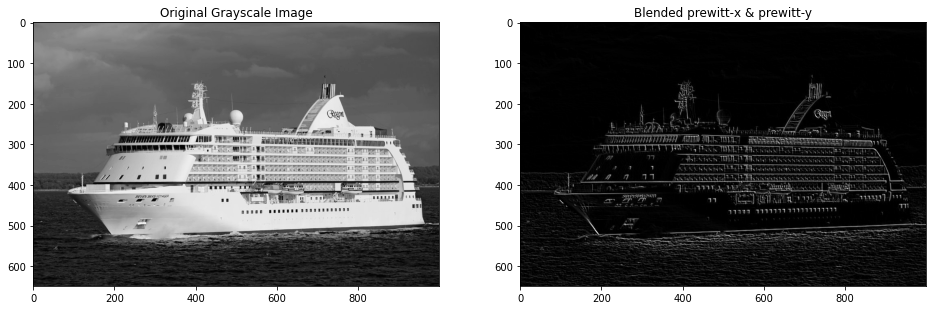

In [65]:
# merging prewitt_x and prewitt_y
blended_xy = cv2.addWeighted(src1=prewitt_x, alpha=0.5, src2=prewitt_y, beta=0.5, gamma=0)

plt.figure(figsize=(16,10))

plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Grayscale Image')

plt.subplot(1, 2, 2)
plt.imshow(blended_xy, cmap='gray')
plt.title('Blended prewitt-x & prewitt-y');

# Frequency Domain

## Frequency Filter

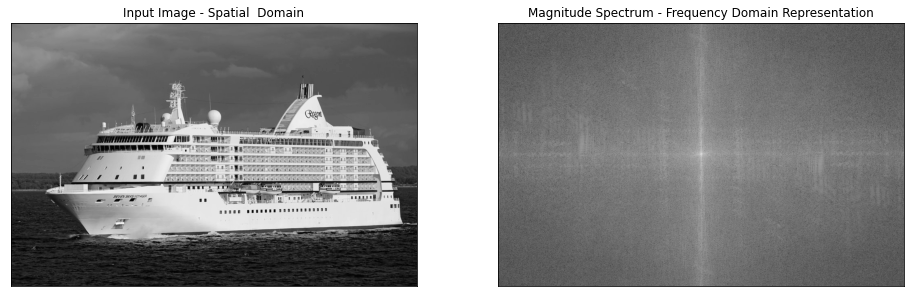

In [66]:
img = cv2.imread('ship.jpeg',0)

dft = cv2.dft(np.float32(img),flags = cv2.DFT_COMPLEX_OUTPUT)

# shift the zero-frequncy component to the center of the spectrum
dft_shift = np.fft.fftshift(dft)

# save image of the image in the fourier domain.
magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))

plt.figure(figsize=(16,10))

plt.subplot(1, 2, 1)
plt.imshow(img, cmap = 'gray')
plt.title('Input Image - Spatial  Domain'), plt.xticks([]), plt.yticks([])

plt.subplot(1, 2, 2)
plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum - Frequency Domain Representation'), plt.xticks([]), plt.yticks([]);

### 1. Low Pass Filter

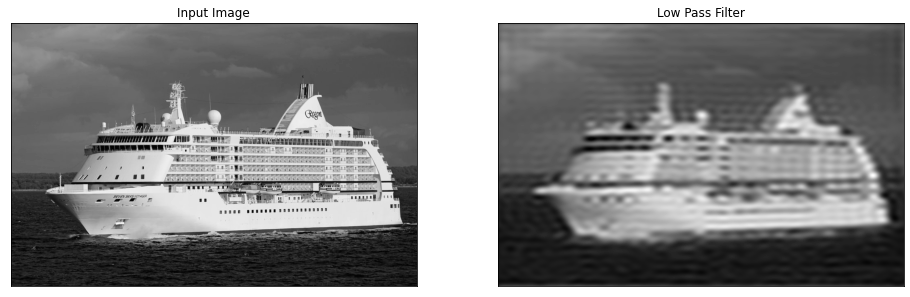

In [67]:
rows, cols = img.shape

crow,ccol = rows//2 , cols//2

# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows,cols,2),np.uint8)
mask[crow-30:crow+30, ccol-30:ccol+30] = 1

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_low_inverse = cv2.idft(f_ishift)
img_low_inverse = cv2.magnitude(img_low_inverse[:,:,0],img_low_inverse[:,:,1])

plt.figure(figsize=(16,10))

plt.subplot(1, 2, 1)
plt.imshow(img, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])

plt.subplot(1, 2, 2)
plt.imshow(img_low_inverse, cmap = 'gray')
plt.title('Low Pass Filter'), plt.xticks([]), plt.yticks([]);

### 2. High Pass Filter

In [68]:
from math import sqrt,exp

In [69]:
def gaussianLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

In [70]:
def gaussianHP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1 - exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

In [71]:
def distance(point1,point2):
    return sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

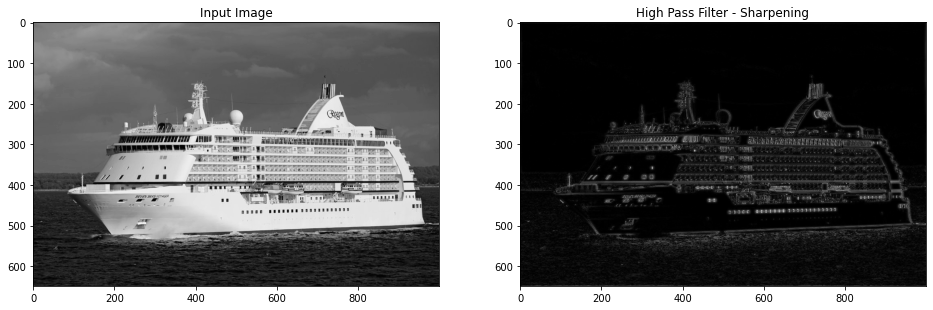

In [72]:
img = cv2.imread("ship.jpeg", 0)

original = np.fft.fft2(img)
center = np.fft.fftshift(original)

HighPassCenter = center * gaussianHP(50,img.shape)
HighPass = np.fft.ifftshift(HighPassCenter)
inverse_HighPass = np.fft.ifft2(HighPass)

plt.figure(figsize=(16,10))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap = 'gray')
plt.title('Input Image')
plt.subplot(1, 2, 2)
plt.imshow(np.abs(inverse_HighPass), cmap = 'gray')
plt.title('High Pass Filter - Sharpening');